In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
from __future__ import print_function
import os
from skimage.transform import resize
from skimage.io import imsave
import numpy as np
from keras.models import Model
from keras.callbacks import ModelCheckpoint
from keras import backend as K
import matplotlib.pyplot as plt
from data import load_train_data,plot_imagesT
import pdb
from skimage.io import imsave, imread
import cv2
import pickle
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
import data
import pylab
import imageio
import matplotlib.pyplot as plt
from  get_model import *
import params 
from natsort import natsorted
from os.path import splitext
from keras.utils import plot_model
import pylab as pl
import data
from skimage.io import imsave, imread
from  gen_data import load_image,random_batch,test_batch,load_images,guided_filter,get_layer_out
from skimage.io import imsave

/home/a252/Documents/Python/CCEPI/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
netparam=params.init() 
netprameval=params.init(train=0) 


{'randcrop': False, 'img_cols': 512, 'epoch_size': 1, 'data_path_eval': './Input/', 'affine': False, 'perspective': False, 'lighting': False, 'Flip': False, 'save_images': True, 'weights': 'imagenet', 'result_dir': './Desmoked', 'batch_size': 5, 'optimizer': 'adam', 'dbg': False, 'predict_batch_size': 5, 'data_path': '/media/a252/540/Smoke_train/', 'nb_epoch': 40, 'img_rows': 512, 'data_path_test': '/media/a252/540/Smoke_test/', 'lr': 0.0001, 'orig_path': '/media/a252/540/daVinci/train/image_0/', 'CLAHE': False, 'CROP': False}


In [3]:
data.create_train_data(netparam)

Training set already exists and loaded from file


In [4]:
imgs, imgs_gt=data.load_train_data()



In [5]:
np.random.seed(1234)
ids_batch = np.random.choice(len(imgs), size=len(imgs), replace=False)
ids_val = ids_batch[: int(len(ids_batch)*0.2)]
ids_train=ids_batch[int(len(ids_batch)*0.2)+1:]


In [6]:
print("Data Information")
print("------")
print("  - No of Frames in Training set: %d" % len(ids_train))
print("  - No of Frames in Test set %d" % len(ids_val))

Data Information
------
  - No of Frames in Training set: 6041
  - No of Frames in Test set 1510


In [7]:

imgs_test=[imgs[img] for img in ids_val]
imgs_mask_test=[imgs_gt[img] for img in ids_val]

#ids_val_batch = np.random.choice(len(imgs_test), size=val_num, replace=False)
imgs_test=np.array(imgs_test)
imgs_mask_test=np.array(imgs_mask_test)
#imgs_mask_test =imgs_mask_test[ids_val_batch]

In [8]:

imgs_train=[imgs[img] for img in ids_train]
imgs_mask_train=[imgs_gt[img] for img in ids_train]


imgs_train=np.array(imgs_train)
imgs_mask_train=np.array(imgs_mask_train)

In [9]:
model = desmokeNET(netparam)
filename='desmokeNET.hdf5'
logdirs='%s%s'%(splitext(filename)[0],'logs')

In [10]:
if  (os.path.exists(filename)):
    print("Loading model from disk")
    model.load_weights(filename, by_name=False)


Loading model from disk


In [11]:
x_batch,y_batch,_=random_batch(imgs_train, imgs_mask_train,netparam, 2)

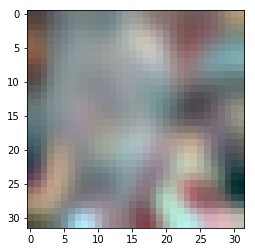

In [12]:
plt.imshow(np.squeeze(x_batch[4][0]));plt.show()

In [13]:
#plt.imshow(np.squeeze(x_batch[0]));plt.show()

In [14]:
x_batch[0].shape

(2, 512, 512, 3)

In [15]:
y_batch.shape

(2, 512, 512, 3)

In [16]:
#x_batch,y_batch,_=random_batch(imgs_train, imgs_mask_train, 1)

In [17]:
model.summary()
plot_model(model, to_file='%s%s'%(splitext(filename)[0],'model.png'))

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 512, 512, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
bn512input_branch (BatchNormali (None, 512, 512, 32) 128         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 512, 512, 32) 0           bn512input_branch[0][0]          
__________________________________________________________________________________________________
conv2d_2 (

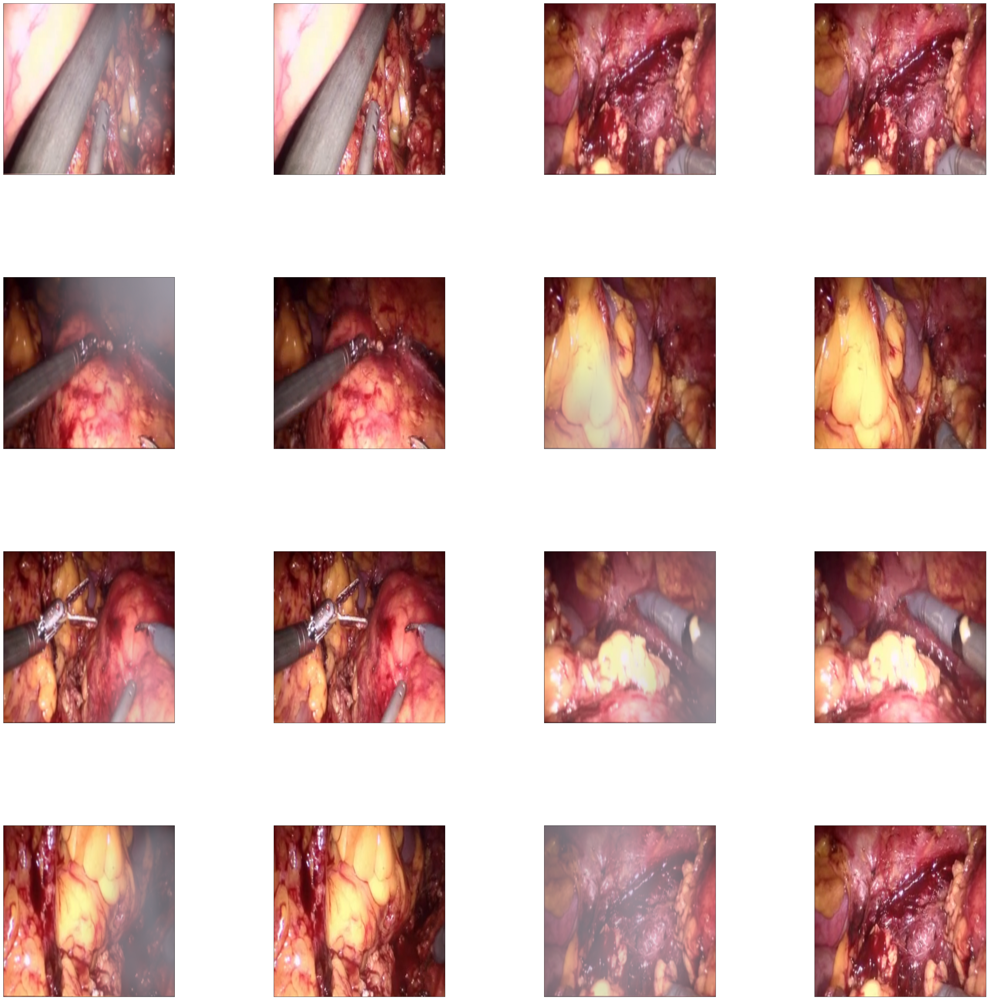

In [18]:
#
x_test, y_test,_=load_images(imgs_train[1000:1008],imgs_mask_train[1000:1008])
plot_imagesT((x_test), np.squeeze(y_test), cls_pred=None, smooth=True, filename='test.png')

In [19]:
batchdata=netparam.batch_size;
def train_generator():
    while True:
        for start in range(0, len(imgs_train), batchdata):
            x_batch = []
            y_batch = []
            end = min(start + batchdata, len(imgs_train))
            x_valid_batch = imgs_train[start:end]
            y_valid_batch = imgs_mask_train[start:end]
            x_batch, y_batch,_ = random_batch(imgs_train, imgs_mask_train ,netparam,batchdata,x_valid_batch,y_valid_batch)
            yield [x_batch[0],x_batch[1],x_batch[2],x_batch[3],x_batch[4]], y_batch

In [20]:

def valid_generator():
    while True:
        for start in range(0, len(imgs_test), batchdata):
            x_batch = []
            y_batch = []
            end = min(start + batchdata, len(imgs_test))
            x_valid_batch = imgs_test[start:end]
            y_valid_batch = imgs_mask_test[start:end]
            x_batch, y_batch,_ = random_batch(imgs_test, imgs_mask_test ,netparam,batchdata,x_valid_batch,y_valid_batch)
            yield [x_batch[0],x_batch[1],x_batch[2],x_batch[3],x_batch[4]], y_batch

In [21]:
callbacks = [EarlyStopping(monitor='val_loss',
                           patience=8,
                           verbose=1,
                           min_delta=1e-4),
             ReduceLROnPlateau(monitor='val_loss',
                               factor=0.1,
                               patience=4,
                               verbose=1,
                               epsilon=1e-10),
             ModelCheckpoint(monitor='val_loss',
                             filepath=filename,
                             save_best_only=True,
                             save_weights_only=True),
             TensorBoard(log_dir=logdirs)]

In [22]:
history =model.fit_generator(generator=train_generator(),
                    steps_per_epoch=np.ceil(float(len(imgs_train)) / float(batchdata)),
                    epochs=netparam.nb_epoch,
                    verbose=1,
                    callbacks=callbacks,
                    validation_data=valid_generator(),
                    validation_steps=np.ceil(float(len(imgs_test)) / float(batchdata)))

Epoch 1/40
  19/1209 [..............................] - ETA: 12:21 - loss: 3.6733e-04 - PSNRLoss: 34.5943

KeyboardInterrupt: 

In [ ]:
histfile='%s%s'%(splitext(filename)[0],'_hist')
with open(histfile, 'wb') as f: 
    pickle.dump([history], f)

# Evaluate on Test data

In [23]:
x_batch,y_batch,_=random_batch(imgs_test, imgs_mask_test,netparam, 8)
pred =  model.predict([x_batch[0],x_batch[1],x_batch[2],x_batch[3],x_batch[4]], batch_size=3,verbose=1)

8/8 [==============================] - 1s 141ms/step


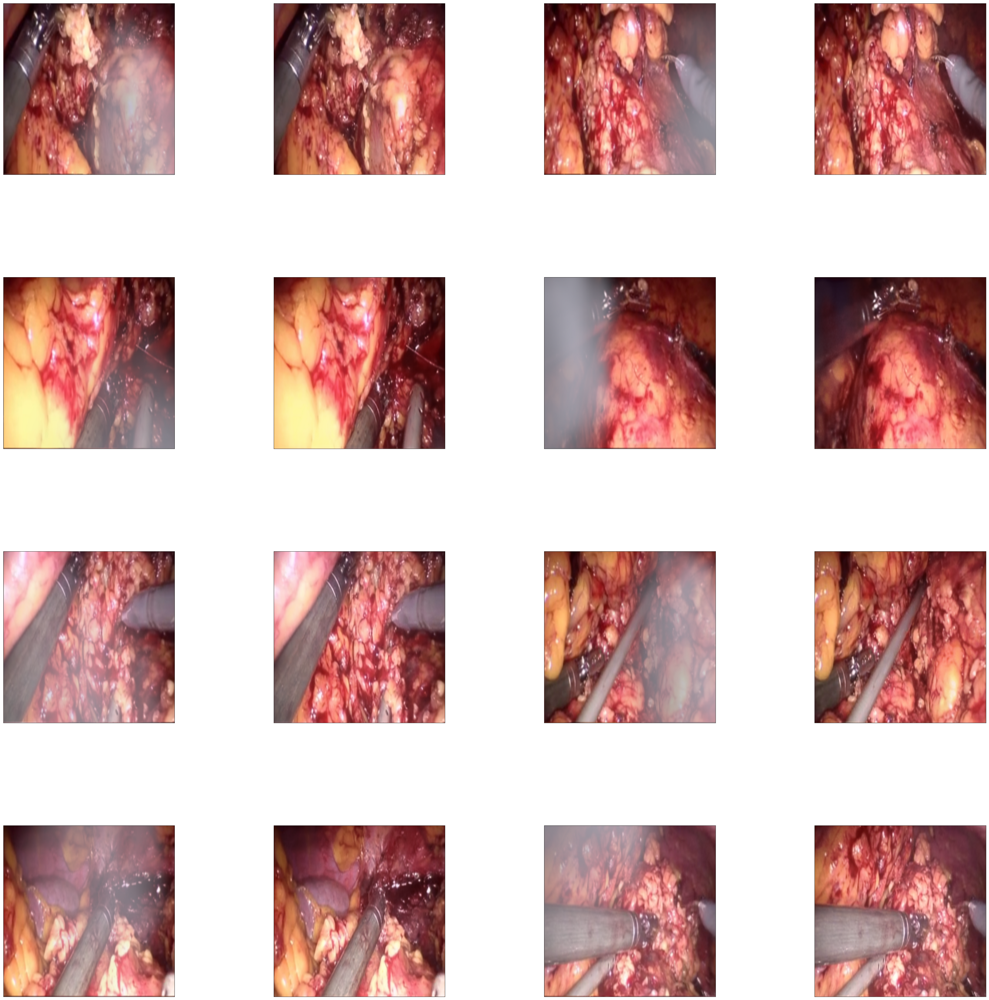

In [24]:
pred=pred
templot=x_batch[0]
plot_imagesT(np.squeeze(x_batch[0]*255), np.squeeze(pred*255), cls_pred=None, smooth=True, filename='REsultest.png')